In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov2_allmodels.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 102 entries, PatientID to Married
dtypes: bool(10), float64(77), int64(11), object(4)
memory usage: 11.4+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v2_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=True, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1172 entries, 4740 to 10150
Data columns (total 96 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PatientID              1172 non-null   int64  
 1   StudyDate              1172 non-null   int64  
 2   SeriesInstanceUID      1172 non-null   object 
 3   LesionID               1172 non-null   int64  
 4   Spiculation            1172 non-null   bool   
 5   Diameter [mm]          1172 non-null   float64
 6   Age                    1172 non-null   int64  
 7   Gender                 1172 non-null   int64  
 8   FamilyHistoryLungCa    1172 non-null   bool   
 9   Emphysema              1172 non-null   bool   
 10  NoduleInUpperLung      1172 non-null   bool   
 11  NoduleCounts           1172 non-null   int64  
 12  SCT_EPI_LOC            1119 non-null   float64
 13  xie_gc_gclobe150       53 non-null     float64
 14  loclup                 127 non-null    float64
 15  locru

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)


In [22]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    "de Haas Combined": "Thijmen_mean",
    "de Haas Local": "Thijmen_local",
    "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    # "de Haas Global (shown nodule)": "Thijmen_global_show",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

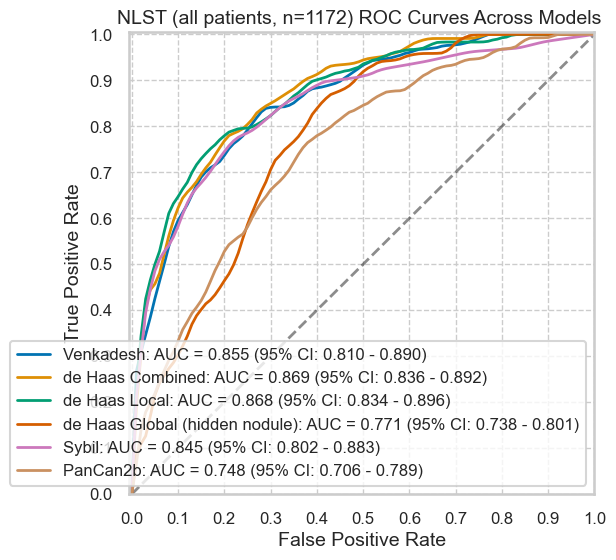

In [23]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

In [24]:
def plot_by_category(df, cat):
    display(Markdown(f"#### {cat}"))
    catinfo, perfs, sigtestresults = utils.roc_cm_by_category(df, cat, MODEL_TO_COL)
    display(catinfo)
    
    if sigtestresults is not None:
        print("Hanley-McNeil significance test results:")
        display(sigtestresults)
    else:
        print("More than binary: not computing significance test results.")

    # for m in perfs:
    #     print(m)
    #     display(perfs[m])

## Split Data by a Category

#### Emphysema

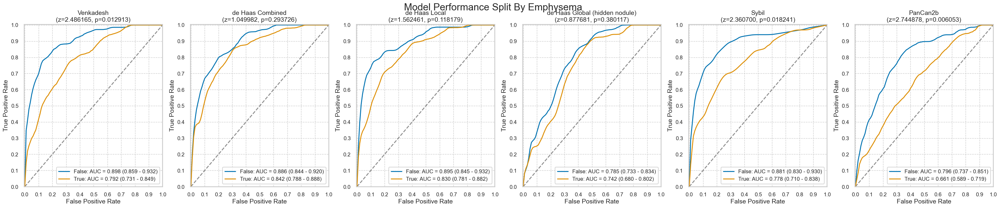

,num,pct,num_mal,pct_mal
False,733,62.542662,70,9.549795
True,439,37.457338,57,12.984055


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,2.486165,1.049982,1.562461,0.877681,2.360700,2.744878
p,0.012913,0.293726,0.118179,0.380117,0.018241,0.006053


In [25]:
SPLIT_CAT = 'Emphysema'
split_groups = nlst_preds.groupby(SPLIT_CAT)
plot_by_category(nlst_preds, SPLIT_CAT)

In [26]:
nlst_democols

{'num': {'demo': ['height', 'weight', 'Age'],
  'smoke': ['pkyr', 'smokeage', 'smokeday', 'smokeyr'],
  'nodule': ['Diameter [mm]', 'CoordX', 'CoordY', 'CoordZ'],
  'other': ['NoduleCounts']},
 'cat': {'demo': ['marital',
   'educat',
   'race',
   'ethnic',
   'Gender',
   'Married',
   'NonHispanicWhite',
   'HighSchoolPlus'],
  'smoke': ['cigar', 'cigsmok', 'pipe', 'smokelive', 'smokework'],
  'work': ['wrkasbe',
   'wrkbaki',
   'wrkbutc',
   'wrkchem',
   'wrkcoal',
   'wrkcott',
   'wrkfarm',
   'wrkfire',
   'wrkflou',
   'wrkfoun',
   'wrkhard',
   'wrkpain',
   'wrksand',
   'wrkweld'],
  'disease': ['diagadas',
   'diagasbe',
   'diagbron',
   'diagchas',
   'diagchro',
   'diagcopd',
   'diagdiab',
   'diagemph',
   'diagfibr',
   'diaghear',
   'diaghype',
   'diagpneu',
   'diagsarc',
   'diagsili',
   'diagstro',
   'diagtube'],
  'canchist': ['cancblad',
   'cancbrea',
   'canccerv',
   'canccolo',
   'cancesop',
   'canckidn',
   'canclary',
   'canclung',
   'cancnasa'

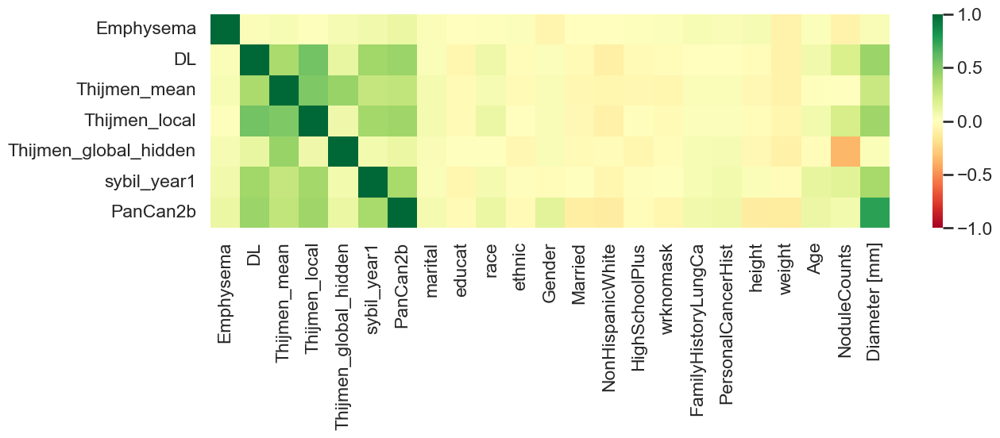

In [27]:
cols_list = [SPLIT_CAT] + list(MODEL_TO_COL.values()) + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]']
correlations = nlst_preds[cols_list].corr(method='kendall').round(4)

corr_rows = [SPLIT_CAT] + list(MODEL_TO_COL.values())
corr_cols = corr_rows + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]']
plt.figure(figsize=(len(corr_cols) * 0.6, len(corr_rows) * 0.5))
sns.heatmap(correlations.loc[corr_rows, corr_cols], cmap='RdYlGn', vmin=-1, vmax=1)
plt.show()

## Plot intersectional results by category

In [28]:
def plot_intersectional(df, cat, split_cat=SPLIT_CAT, split_groups=split_groups):
    for splitval, splitdf in split_groups:
        display(Markdown(f"#### {cat}: {split_cat} = {splitval}"))
        catinfo, perfs, sigtestresults = utils.roc_cm_by_category(splitdf, cat, MODEL_TO_COL)
        display(catinfo)
        
        if sigtestresults is not None:
            print("Hanley-McNeil significance test results:")
            display(sigtestresults)
        else:
            print("More than binary: not computing significance test results.")

        # for m in perfs:
        #     print(m)
        #     display(perfs[m])

### Included columns (from predictions)

#### wrknomask: Emphysema = False

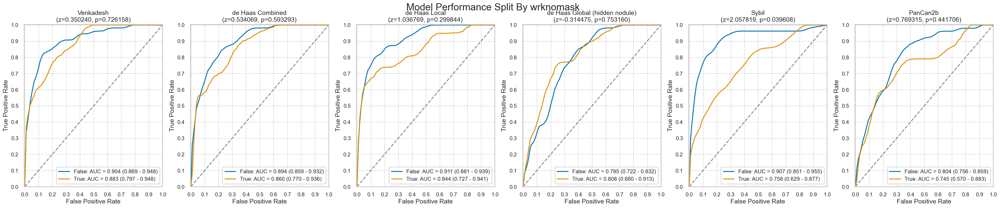

,num,pct,num_mal,pct_mal
False,551,75.170532,53,9.618875
True,182,24.829468,17,9.340659


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.350240,0.534069,1.036769,-0.314475,2.057819,0.769315
p,0.726158,0.593293,0.299844,0.753160,0.039608,0.441706


#### wrknomask: Emphysema = True

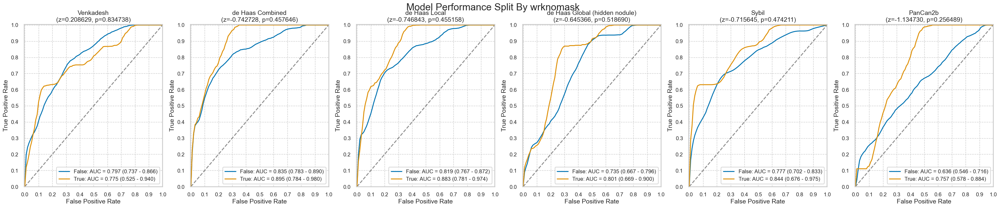

,num,pct,num_mal,pct_mal
False,321,73.120729,49,15.264798
True,118,26.879271,8,6.779661


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.208629,-0.742728,-0.746843,-0.645366,-0.715645,-1.134730
p,0.834738,0.457646,0.455158,0.518690,0.474211,0.256489


#### FamilyHistoryLungCa: Emphysema = False

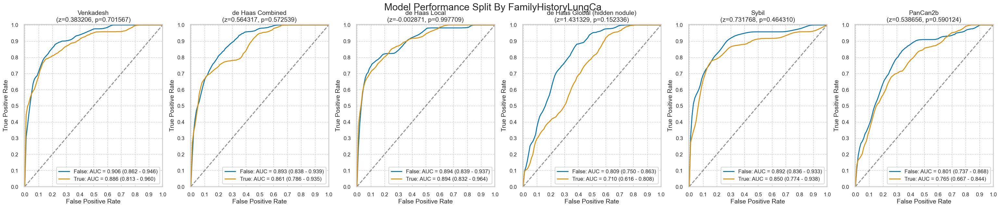

,num,pct,num_mal,pct_mal
False,555,75.716235,46,8.288288
True,178,24.283765,24,13.483146


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.383206,0.564317,-0.002871,1.431329,0.731768,0.538656
p,0.701567,0.572539,0.997709,0.152336,0.464310,0.590124


#### FamilyHistoryLungCa: Emphysema = True

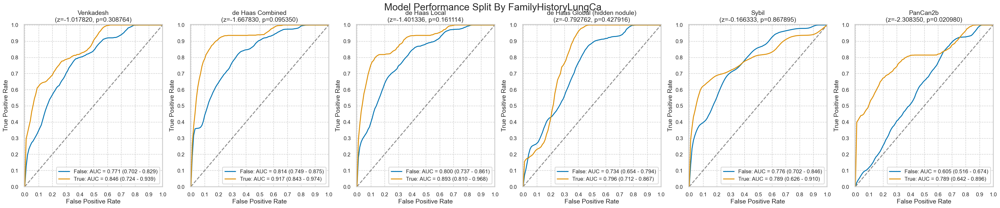

,num,pct,num_mal,pct_mal
False,315,71.753986,41,13.015873
True,124,28.246014,16,12.903226


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.017820,-1.66783,-1.401336,-0.792762,-0.166333,-2.30835
p,0.308764,0.09535,0.161114,0.427916,0.867895,0.02098


#### PersonalCancerHist: Emphysema = False

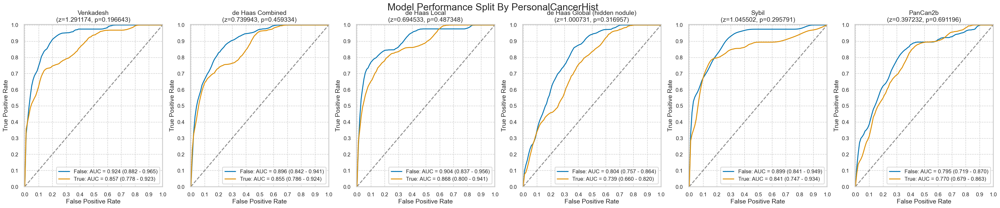

,num,pct,num_mal,pct_mal
False,524,71.48704,41,7.824427
True,209,28.51296,29,13.875598


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.291174,0.739943,0.694533,1.000731,1.045502,0.397232
p,0.196643,0.459334,0.487348,0.316957,0.295791,0.691196


#### PersonalCancerHist: Emphysema = True

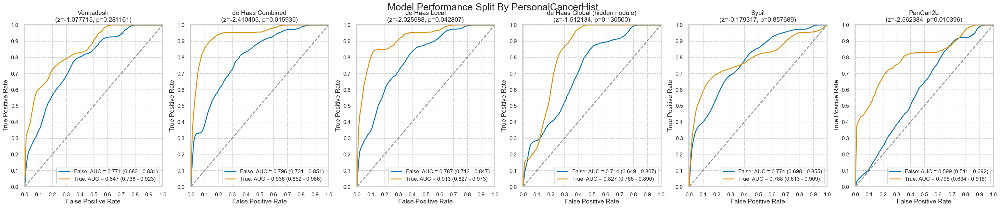

,num,pct,num_mal,pct_mal
False,300,68.33713,39,13.00000
True,139,31.66287,18,12.94964


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.077715,-2.410405,-2.025588,-1.512134,-0.179317,-2.562384
p,0.281161,0.015935,0.042807,0.130500,0.857689,0.010396


In [29]:
for c in nlst_democols['cat']['other']:
    plot_intersectional(nlst_preds, c)

### Demographics

#### marital: Emphysema = False

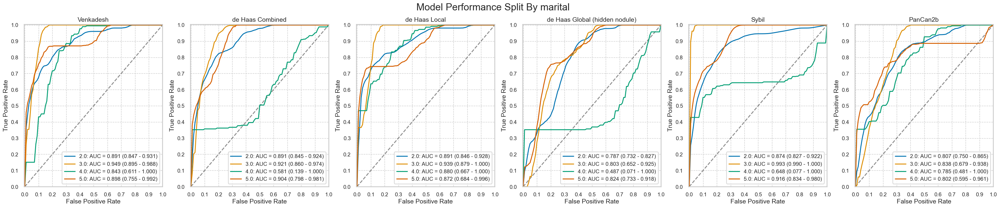

,num,pct,num_mal,pct_mal
1.0,33,4.502046,0,0.000000
2.0,493,67.257844,52,10.547667
3.0,68,9.276944,7,10.294118
4.0,15,2.046385,3,20.000000
5.0,124,16.916780,8,6.451613


More than binary: not computing significance test results.


#### marital: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:158: RuntimeWarning: invalid value encountered in scalar divide
  metrics["ppv"] = tp / (tp + fp)  ## Precision: positive predictive value
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:160: RuntimeWarning: invalid value encountered in scalar divide
  metrics["fdr"] = fp / (fp + tp)  ## False discovery rate


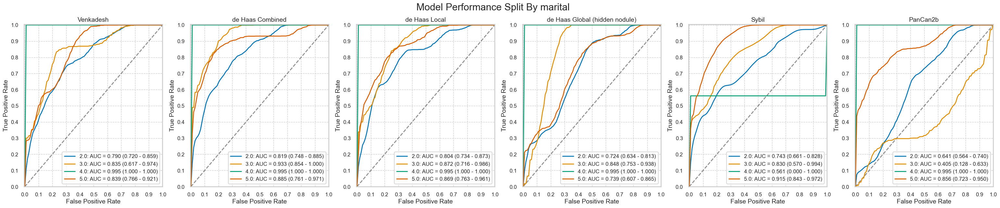

,num,pct,num_mal,pct_mal
1.0,13,2.961276,0,0.000000
2.0,292,66.514806,34,11.643836
3.0,52,11.845103,7,13.461538
4.0,4,0.911162,2,50.000000
5.0,78,17.767654,14,17.948718


More than binary: not computing significance test results.


#### educat: Emphysema = False

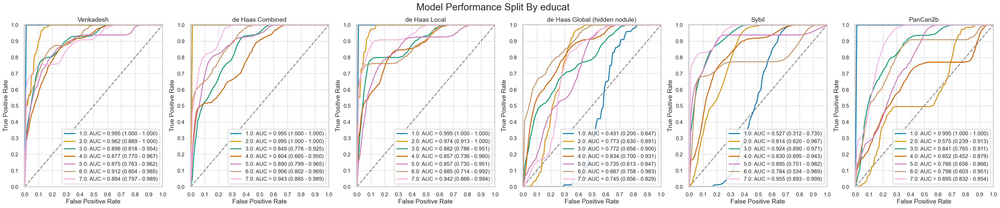

,num,pct,num_mal,pct_mal
1.0,18,2.489627,2,11.111111
2.0,47,6.500692,2,4.255319
3.0,183,25.311203,17,9.289617
4.0,98,13.554633,12,12.244898
5.0,143,19.778700,15,10.489510
6.0,114,15.767635,9,7.894737
7.0,120,16.597510,13,10.833333


More than binary: not computing significance test results.


#### educat: Emphysema = True

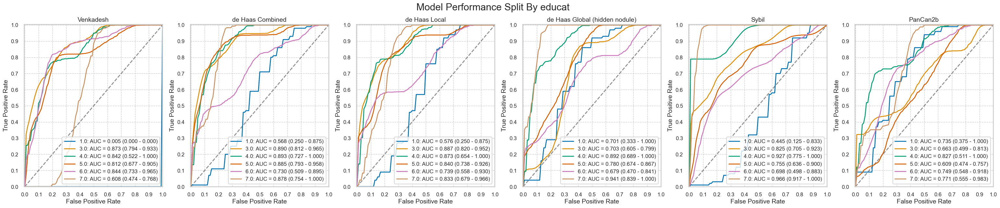

,num,pct,num_mal,pct_mal
1.0,9,2.093023,2,22.222222
2.0,20,4.651163,0,0.000000
3.0,124,28.837209,19,15.322581
4.0,46,10.697674,4,8.695652
5.0,101,23.488372,16,15.841584
6.0,71,16.511628,12,16.901408
7.0,59,13.720930,3,5.084746


More than binary: not computing significance test results.


#### race: Emphysema = False

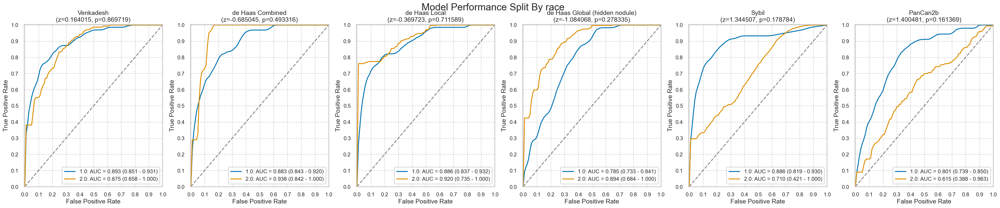

,num,pct,num_mal,pct_mal
1.0,687,94.109589,60,8.733624
2.0,21,2.876712,5,23.809524
3.0,6,0.821918,0,0.000000
4.0,4,0.547945,4,100.000000
5.0,1,0.136986,1,100.000000
6.0,11,1.506849,0,0.000000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.164015,-0.685045,-0.369723,-1.084068,1.344507,1.400481
p,0.869719,0.493316,0.711589,0.278335,0.178784,0.161369


#### race: Emphysema = True

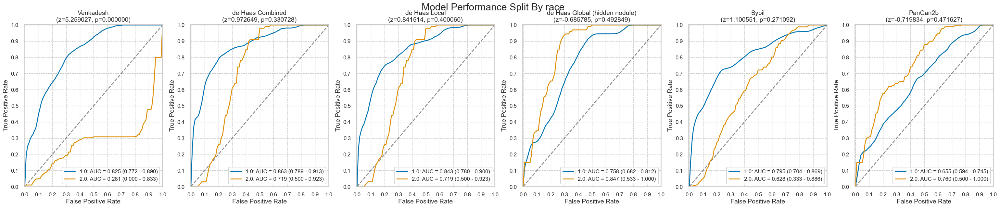

,num,pct,num_mal,pct_mal
1.0,411,93.621868,52,12.652068
2.0,19,4.328018,4,21.052632
3.0,1,0.227790,0,0.000000
4.0,6,1.366743,1,16.666667
5.0,2,0.455581,0,0.000000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,5.259027e+00,0.972649,0.841514,-0.685785,1.100551,-0.719834
p,1.448195e-07,0.330728,0.400060,0.492849,0.271092,0.471627


#### ethnic: Emphysema = False

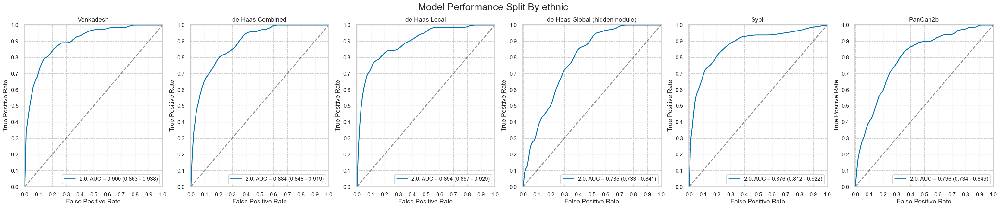

,num,pct,num_mal,pct_mal
1.0,8,1.092896,1,12.500000
2.0,724,98.907104,69,9.530387


More than binary: not computing significance test results.


#### ethnic: Emphysema = True

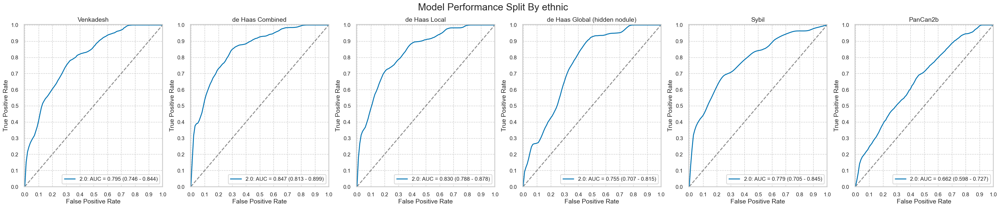

,num,pct,num_mal,pct_mal
1.0,3,0.684932,0,0.000000
2.0,435,99.315068,57,13.103448


More than binary: not computing significance test results.


#### Gender: Emphysema = False

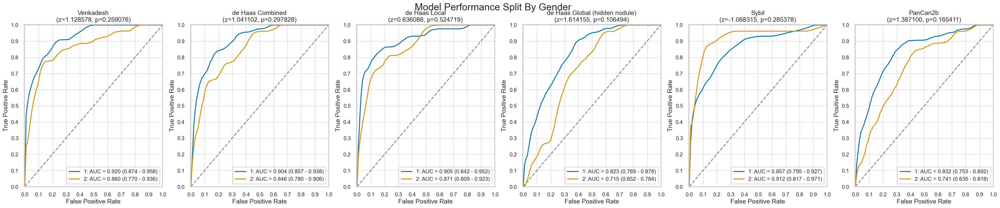

,num,pct,num_mal,pct_mal
1,415,56.616644,43,10.361446
2,318,43.383356,27,8.490566


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.128578,1.041102,0.636088,1.614155,-1.068315,1.387100
p,0.259076,0.297828,0.524719,0.106494,0.285378,0.165411


#### Gender: Emphysema = True

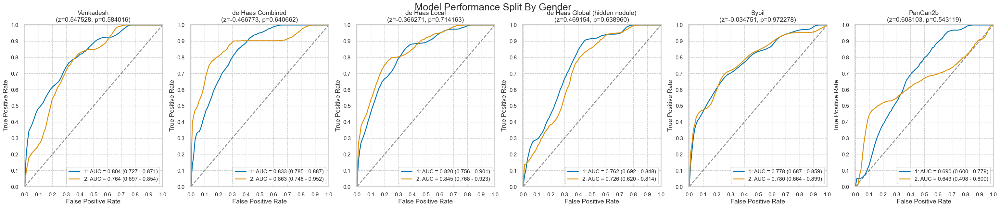

,num,pct,num_mal,pct_mal
1,278,63.32574,36,12.949640
2,161,36.67426,21,13.043478


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.547528,-0.466773,-0.366271,0.469154,-0.034751,0.608103
p,0.584016,0.640662,0.714163,0.638960,0.972278,0.543119


#### Married: Emphysema = False

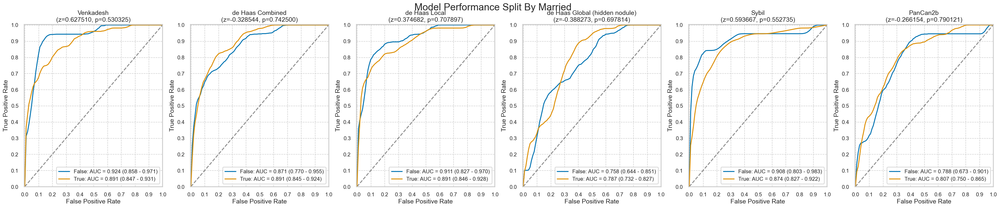

,num,pct,num_mal,pct_mal
False,240,32.742156,18,7.500000
True,493,67.257844,52,10.547667


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.627510,-0.328544,0.374682,-0.388273,0.593667,-0.266154
p,0.530325,0.742500,0.707897,0.697814,0.552735,0.790121


#### Married: Emphysema = True

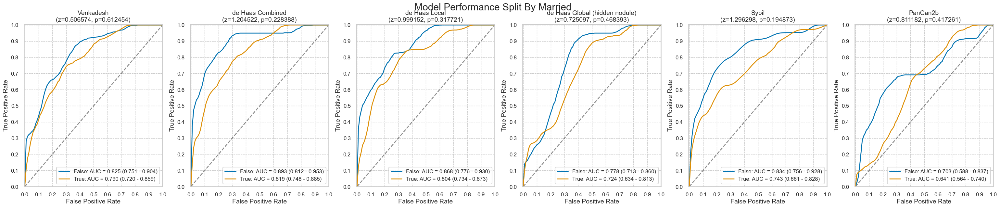

,num,pct,num_mal,pct_mal
False,147,33.485194,23,15.646259
True,292,66.514806,34,11.643836


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.506574,1.204522,0.999152,0.725097,1.296298,0.811182
p,0.612454,0.228388,0.317721,0.468393,0.194873,0.417261


#### NonHispanicWhite: Emphysema = False

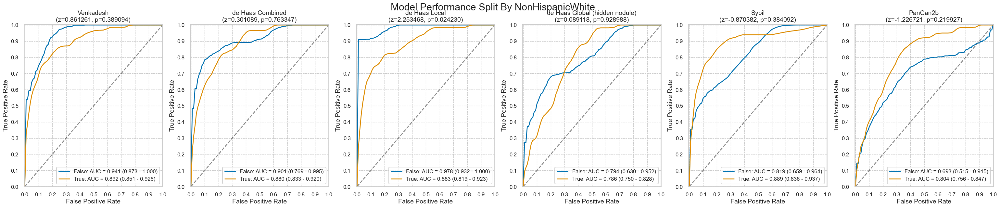

,num,pct,num_mal,pct_mal
False,51,6.957708,11,21.568627
True,682,93.042292,59,8.651026


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.861261,0.301089,2.253468,0.089118,-0.870382,-1.226721
p,0.389094,0.763347,0.024230,0.928988,0.384092,0.219927


#### NonHispanicWhite: Emphysema = True

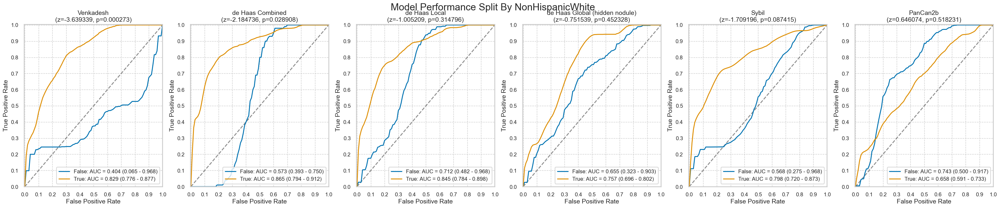

,num,pct,num_mal,pct_mal
False,32,7.289294,5,15.625000
True,407,92.710706,52,12.776413


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-3.639339,-2.184736,-1.005209,-0.751539,-1.709196,0.646074
p,0.000273,0.028908,0.314796,0.452328,0.087415,0.518231


#### HighSchoolPlus: Emphysema = False

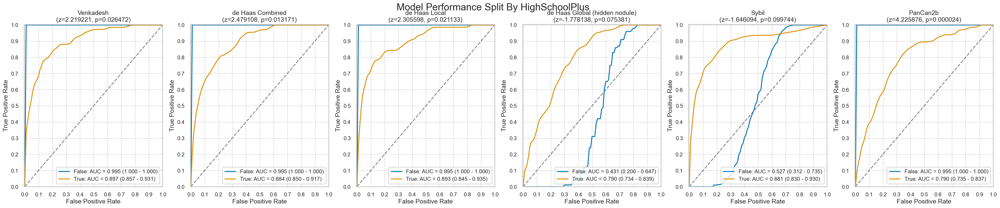

,num,pct,num_mal,pct_mal
False,18,2.455662,2,11.111111
True,715,97.544338,68,9.510490


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,2.219221,2.479108,2.305598,-1.778138,-1.646094,4.225876
p,0.026472,0.013171,0.021133,0.075381,0.099744,0.000024


#### HighSchoolPlus: Emphysema = True

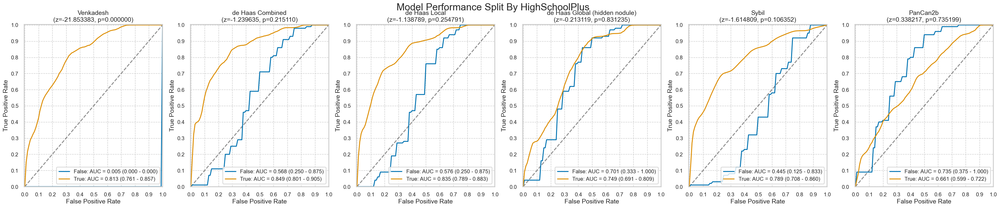

,num,pct,num_mal,pct_mal
False,9,2.050114,2,22.222222
True,430,97.949886,55,12.790698


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-2.185338e+01,-1.239635,-1.138789,-0.213119,-1.614809,0.338217
p,7.218311e-106,0.215110,0.254791,0.831235,0.106352,0.735199


In [30]:
for cat in nlst_democols['cat']['demo']:
    plot_intersectional(nlst_preds, cat)

## Binning for numerical demographic columns

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\3338818666.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_Age')['label'].describe())


,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"(54.999, 63.0]",654.0,0.100917,0.301450,0.0,0.0,0.0,0.0,1.0
"(63.0, 76.0]",518.0,0.117761,0.322636,0.0,0.0,0.0,0.0,1.0


#### bin_Age: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


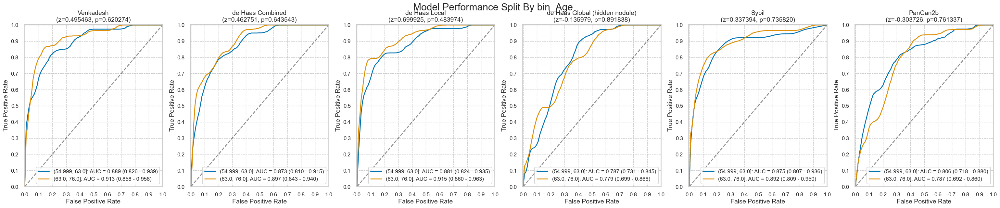

,num,pct,num_mal,pct_mal
"(54.999, 63.0]",421,57.435198,39,9.263658
"(63.0, 76.0]",312,42.564802,31,9.935897


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.495463,0.462751,0.699925,-0.135979,0.337394,-0.303726
p,0.620274,0.643543,0.483974,0.891838,0.735820,0.761337


#### bin_Age: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


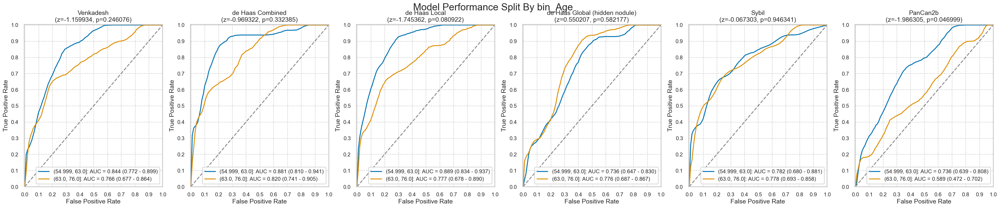

,num,pct,num_mal,pct_mal
"(54.999, 63.0]",233,53.075171,27,11.587983
"(63.0, 76.0]",206,46.924829,30,14.563107


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.159934,-0.969322,-1.745362,0.550207,-0.067303,-1.986305
p,0.246076,0.332385,0.080922,0.582177,0.946341,0.046999


In [31]:
# nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
nlst_preds['bin_Age'] = pd.qcut(nlst_preds['Age'], q=2)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_intersectional(nlst_preds, f'bin_Age')

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\1366853022.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())


label                                              height  \
            count      mean       std  min  25%  50%  75%  max  count   
bin_height                                                              
(48, 68]    590.0  0.096610  0.295677  0.0  0.0  0.0  0.0  1.0  590.0   
(68, 88]    582.0  0.120275  0.325563  0.0  0.0  0.0  0.0  1.0  582.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.957627  2.309624  59.0  63.0  65.0  67.0  68.0  
(68, 88]    71.348797  1.939797  69.0  70.0  71.0  72.0  78.0

#### bin_height: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


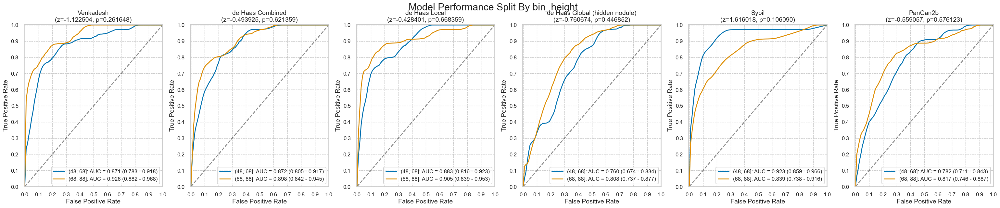

,num,pct,num_mal,pct_mal
"(48, 68]",380,51.841746,34,8.947368
"(68, 88]",353,48.158254,36,10.198300


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.122504,-0.493925,-0.428401,-0.760674,1.616018,-0.559057
p,0.261648,0.621359,0.668359,0.446852,0.106090,0.576123


#### bin_height: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


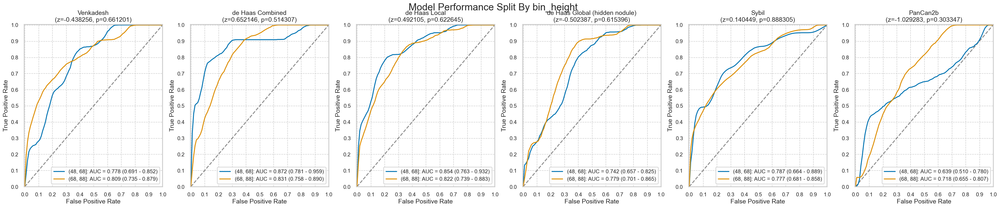

,num,pct,num_mal,pct_mal
"(48, 68]",210,47.835991,23,10.952381
"(68, 88]",229,52.164009,34,14.847162


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.438256,0.652146,0.492105,-0.502387,0.140449,-1.029283
p,0.661201,0.514307,0.622645,0.615396,0.888305,0.303347


In [32]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_intersectional(nlst_preds, f'bin_height')

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\936658290.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())


label                                              weight  \
            count      mean       std  min  25%  50%  75%  max  count   
bin_weight                                                              
(79, 179]   565.0  0.107965  0.310611  0.0  0.0  0.0  0.0  1.0  565.0   
(179, 279]  588.0  0.108844  0.311708  0.0  0.0  0.0  0.0  1.0  588.0   

                                                                      
                  mean        std    min    25%    50%    75%    max  
bin_weight                                                            
(79, 179]   150.851327  20.469988   90.0  139.0  155.0  168.0  178.0  
(179, 279]  210.079932  24.316386  180.0  190.0  204.0  225.0  275.0

#### bin_weight: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


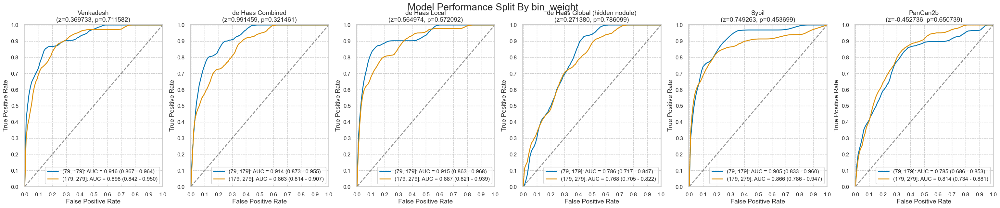

,num,pct,num_mal,pct_mal
"(79, 179]",332,46.111111,31,9.337349
"(179, 279]",388,53.888889,37,9.536082


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.369733,0.991459,0.564974,0.271380,0.749263,-0.452736
p,0.711582,0.321461,0.572092,0.786099,0.453699,0.650739


#### bin_weight: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


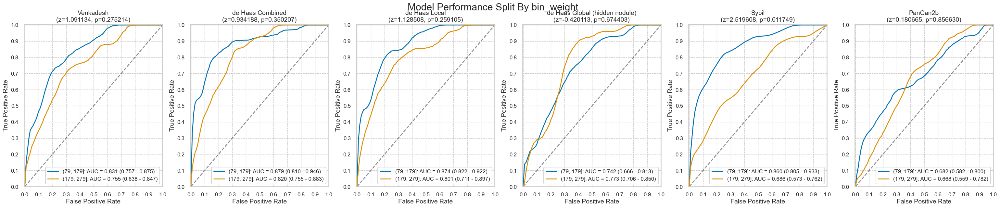

,num,pct,num_mal,pct_mal
"(79, 179]",233,53.810624,30,12.875536
"(179, 279]",200,46.189376,27,13.500000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.091134,0.934188,1.128508,-0.420113,2.519608,0.180665
p,0.275214,0.350207,0.259105,0.674403,0.011749,0.856630


In [33]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_intersectional(nlst_preds, f'bin_weight')